# Exercise 4 (Training without Bayes Optimization)

In [1]:
import pandas as pd

import warnings
warnings.filterwarnings('ignore')

dfWind = pd.read_csv('../data/data_wind_preprocessed1.csv')
dfWind.head()

,Hour,Wind direction (gr),Wind speed (m/s),Wind gust max (m/s),Date,Relative humidity max,Relative humidity min,Temperature max (K),Temperature min (K),Relative humidity,Atmospheric pressure at station level (Pa),Precipitation (m),Atmospheric pressure max (Pa),Atmospheric pressure min (Pa)
0,12,0.809017,1.8,3.8,2000-01-01 12:00:00,0.69,0.60,293.85,295.75,0.61,88820.0,0.0,88820.0,88770.0
1,13,0.965926,2.7,4.7,2000-01-01 13:00:00,0.62,0.55,295.65,297.35,0.55,88840.0,0.0,88840.0,88820.0
2,14,0.891007,2.0,4.9,2000-01-01 14:00:00,0.56,0.50,297.45,298.65,0.51,88810.0,0.0,88840.0,88810.0
3,15,0.848048,2.5,5.8,2000-01-01 15:00:00,0.52,0.44,298.15,300.55,0.44,88740.0,0.0,88810.0,88740.0
4,16,0.224951,2.4,5.8,2000-01-01 16:00:00,0.50,0.43,298.65,300.25,0.46,88650.0,0.0,88740.0,88650.0


In [2]:
dfWind.shape

(90276, 14)

In [3]:
from sklearn.linear_model import LinearRegression, Lasso, Ridge, BayesianRidge
from sklearn.tree import DecisionTreeRegressor
from sklearn.ensemble import RandomForestRegressor, GradientBoostingRegressor
from sklearn.neighbors import KNeighborsRegressor
from sklearn.preprocessing import MinMaxScaler, StandardScaler
from sklearn.svm import SVR
from skopt.space import Real, Categorical, Integer

n_col = dfWind.shape[1]

models_dict = {
    'SVR': {
        'model': SVR(),
        'scalers': {
            'scaler': Categorical([MinMaxScaler(), StandardScaler()])
        },
        'grid': {
            'model__C': Real(0.0001, 10000),
            'model__epsilon': Real(0.0001, 10000),
        },
        'best_params': {},
    },

    'Linear Regression': {
        'model': LinearRegression(),
        'scalers': {
            'scaler': Categorical([None, MinMaxScaler(), StandardScaler()])
        },
        'grid': {},
        'best_params': {},
    },

    'Bayesian Ridge': {
        'model': BayesianRidge(),
        'scalers': {
            'scaler': Categorical([None, MinMaxScaler(), StandardScaler()])
        },
        'grid': {
            'model__alpha_1': (0.000001, 0.01),
            'model__alpha_2': (0.000001, 0.01),
            'model__lambda_1': (0.000001, 0.01),
            'model__lambda_2': (0.000001, 0.01),
        },
        'best_params': {},
    },

    'Decision Tree': {
        'model': DecisionTreeRegressor(random_state=42),
        'scalers': {
            'scaler': Categorical([None])
        },
        'grid': {
            'model__max_depth': Integer(1, n_col),
        },
        'best_params': {},
    },

    'Random Forest': {
        'model': RandomForestRegressor(random_state=42),
        'scalers': {
            'scaler': Categorical([None])
        },
        'grid': {
            'model__max_depth': Integer(1, n_col),
            'model__n_estimators': Integer(10, 200)
        },
        'best_params': {},
    },

    'Gradient Boosting': {
        'model': GradientBoostingRegressor(random_state=42),
        'scalers': {
            'scaler': Categorical([None])
        },
        'grid': {
            'model__max_depth': Integer(1, n_col),
            'model__n_estimators': Integer(10, 200),            
        },
        'best_params': {},
    },

    'K-NN': {
        'model': KNeighborsRegressor(n_jobs=-1),
        'scalers': {
            'scaler': Categorical([None, MinMaxScaler(), StandardScaler()])
        },
        'grid': {
            'model__n_neighbors': Integer(1, 20),
        },
        'best_params': {},
    },

    'Ridge': {
        'model': Ridge(random_state=42),
        'scalers': {
            'scaler': Categorical([None, MinMaxScaler(), StandardScaler()])
        },
        'grid': {
            'model__alpha': Real(0.0001, 10000)
        },
        'best_params': {},
    },

    'Lasso': {
        'model': Lasso(random_state=42),
        'scalers': {
            'scaler': Categorical([None, MinMaxScaler(), StandardScaler()])
        },
        'grid': {
            'model__alpha': Real(0.0001, 10000)
        },
        'best_params': {},
    },
}

number_of_days = [1, 3, 7, 14, 21, 30, 60, 90, 180, 365]

In [4]:
results_dict = {
        name:{
            numDays: {
                'model': None, 'pred': [], 'test': [], 'cpu_time': None, 'MAPEs': [], 'R2s': [], 'RMSEs': []
            } for numDays in number_of_days
        } for name in models_dict
}

## Hyperparametrization

We find the best parameters only on the first set to avoid a too big data lake

In [5]:
from skopt import BayesSearchCV
from sklearn.pipeline import Pipeline
from copy import deepcopy
from time import time
import os
import pickle

path_tuning = '../pickle/wind/tuning_bs.pkl'

if not os.path.exists(path_tuning):
    for name in models_dict:
        print(f"Tuning {name}...")
        model_dict = models_dict[name]
        param_grid = {
            **model_dict['scalers'],
            **model_dict['grid']
        }
        for numDays in number_of_days:
            X_train = dfWind.iloc[0:numDays*24].drop(columns=['Wind speed (m/s)', 'Date'])
            y_train = dfWind.iloc[0:numDays*24]['Wind speed (m/s)']
            steps = [
                ('scaler', None),
                ('model', deepcopy(model_dict['model']))
            ]
            pipeline = Pipeline(steps)
            search_cv = BayesSearchCV(pipeline, search_space=param_grid, n_iter=20, scoring='r2', cv=5, n_jobs=-1, random_state=42)
            start = time()
            search_cv.fit(X_train, y_train)
            end = time()
            results_dict[name][numDays]['model'] = search_cv.best_estimator_
            model_dict['best_params'][numDays] = search_cv.best_params_
            print(f"{numDays} days => {round(end - start, 1)}s => {search_cv.best_params_}")
        print()
    with open(path_tuning, 'wb') as f:
        pickle.dump(results_dict, f)
else:
    with open(path_tuning, 'rb') as f:
        results_dict = pickle.load(f)

Tuning SVR...
1 days => 2.6s => {'model__C': 0.01, 'model__epsilon': 0.001, 'model__kernel': 'poly', 'scaler': MinMaxScaler()}
3 days => 3.9s => {'model__C': 0.1, 'model__epsilon': 0.1, 'model__kernel': 'poly', 'scaler': MinMaxScaler()}
7 days => 14.9s => {'model__C': 10, 'model__epsilon': 0.01, 'model__kernel': 'linear', 'scaler': MinMaxScaler()}
14 days => 80.5s => {'model__C': 1, 'model__epsilon': 0.1, 'model__kernel': 'linear', 'scaler': StandardScaler()}


## Training

In [ ]:
from time import time
import os
import pickle
from utils import model_evaluation_lr


path_results = '../pickle/wind/results_bs.pkl'

if not os.path.exists(path_results):
    dict_pred = {}
    X = dfWind.drop(columns=['Wind speed (m/s)', 'Date'])
    y = dfWind['Wind speed (m/s)']

    for i, name in enumerate(models_dict):
        model_dict = models_dict[name]
        print(f"Training {name}...")
        for numDays in number_of_days:
            best_params_cleaned = {k.replace('model__', ''): v for k, v in model_dict['best_params'][numDays].items() if k.startswith('model__')}
            pipeline = Pipeline(
                [
                    ('scaler', model_dict['best_params'][numDays]['scaler']),
                    ('model', deepcopy(model_dict['model']).set_params(**best_params_cleaned)),
                ]
            )
            print(f'{numDays} days', end='')
            start = time()
            for j in range(0, dfWind.shape[0] - (numDays + 1)*24, 24):
                X_train = X.iloc[j:j+numDays*24]
                y_train = y.iloc[j:j+numDays*24]
                X_valid = X.iloc[j+numDays*24:j+((numDays + 1)*24)]
                y_valid = y.iloc[j+numDays*24:j+((numDays + 1)*24)]
                
                pipeline.fit(X_train, y_train)
                y_pred = pipeline.predict(X_valid)
                eval_lr = model_evaluation_lr(y_pred, y_valid)

                results_numDays = results_dict[name][numDays]
                results_numDays['pred'] += y_pred.tolist()
                results_numDays['test'] += y_valid.tolist()
                results_numDays['MAPEs'].append(eval_lr['mape'])
                results_numDays['R2s'].append(eval_lr['r2'])
                results_numDays['RMSEs'].append(eval_lr['rmse'])
            end = time()
            cpu_time = round(end - start, 1)
            print(f" => {cpu_time}s")
            results_numDays['cpu_time'] = cpu_time
        print()
    with open(path_results, 'wb') as f:
        pickle.dump(results_dict, f)
else:
    with open(path_results, 'rb') as f:
        results_dict = pickle.load(f)

## Results

In [ ]:
results_overall = pd.DataFrame(columns=['Model', 'CPU time', 'MAPE', 'R2', 'RMSE'])

for name in results_dict:
    model_dict = models_dict[name]
    for numDays in model_dict['n_days']:
        results = results_dict[name][numDays]
        eval = model_evaluation_lr(results['pred'], results['test'])
        new_row = {
            'Model': f"{name} ({numDays} days)",
            'CPU time': results['cpu_time'],
            'MAPE': eval['mape'],
            'R2': eval['r2'],
            'RMSE': eval['rmse']
        }
        results_overall = pd.concat([results_overall, pd.DataFrame(new_row, index=[0])], ignore_index=True)

In [ ]:
results_overall.sort_values('R2', ascending=False, inplace=True)
print(results_overall.to_string(index=False))

                     Model  CPU time         MAPE     R2    RMSE
Gradient Boosting (3 days)     193.2 3.820000e-01  0.580   0.739
    Random Forest (3 days)      34.5 5.642482e+11  0.574   0.737
    Random Forest (2 days)     115.0 9.984037e+09  0.501   0.764
    Decision Tree (3 days)       9.2 3.660706e+13  0.499   0.871
    Decision Tree (2 days)       8.8 7.570750e+13  0.431   0.950
   Bayesian Ridge (3 days)      12.0 4.420000e-01  0.415   1.179
            Ridge (3 days)      10.1 6.820000e-01  0.410   1.194
            Lasso (3 days)      10.9 4.080000e-01  0.385   1.281
Gradient Boosting (1 days)     165.7 5.600000e-01  0.353   0.909
Linear Regression (3 days)       8.0 5.430000e-01  0.313   1.527
    Random Forest (1 days)     189.6 3.360000e-01  0.264   0.891
            Lasso (2 days)      11.1 8.780000e-01  0.245   1.803
   Bayesian Ridge (2 days)      11.9 5.520000e-01  0.243   1.724
            Ridge (2 days)      10.3 6.790000e-01  0.223   1.917
Linear Regression (2 days

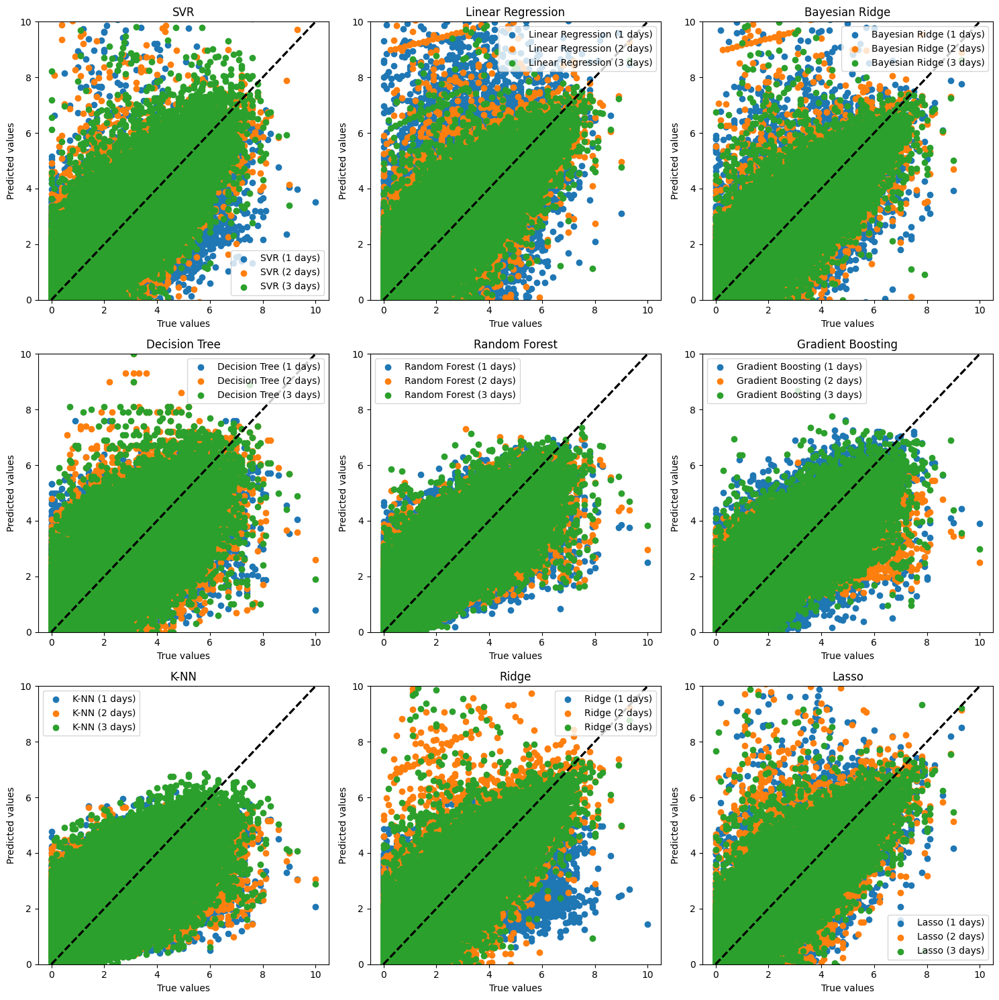

In [ ]:
import matplotlib.pyplot as plt

fig, axs = plt.subplots(3, 3, figsize=(15, 15))
axs = axs.flatten()

for i, name in enumerate(results_dict):
    for numDays in models_dict[name]['n_days']:
        results = results_dict[name][numDays]
        y_pred = results['pred']
        y_test = results['test']
        axs[i].plot([0, max(y_test)], [0, max(y_test)], 'k--', lw=2)
        axs[i].scatter(y_test, y_pred, label=f"{name} ({numDays} days)")
        axs[i].set_ylim(0, max(y_test))
        axs[i].set_title(f"{name}")
        axs[i].set_xlabel('True values')
        axs[i].set_ylabel('Predicted values')
        axs[i].legend()

plt.tight_layout()
plt.show()

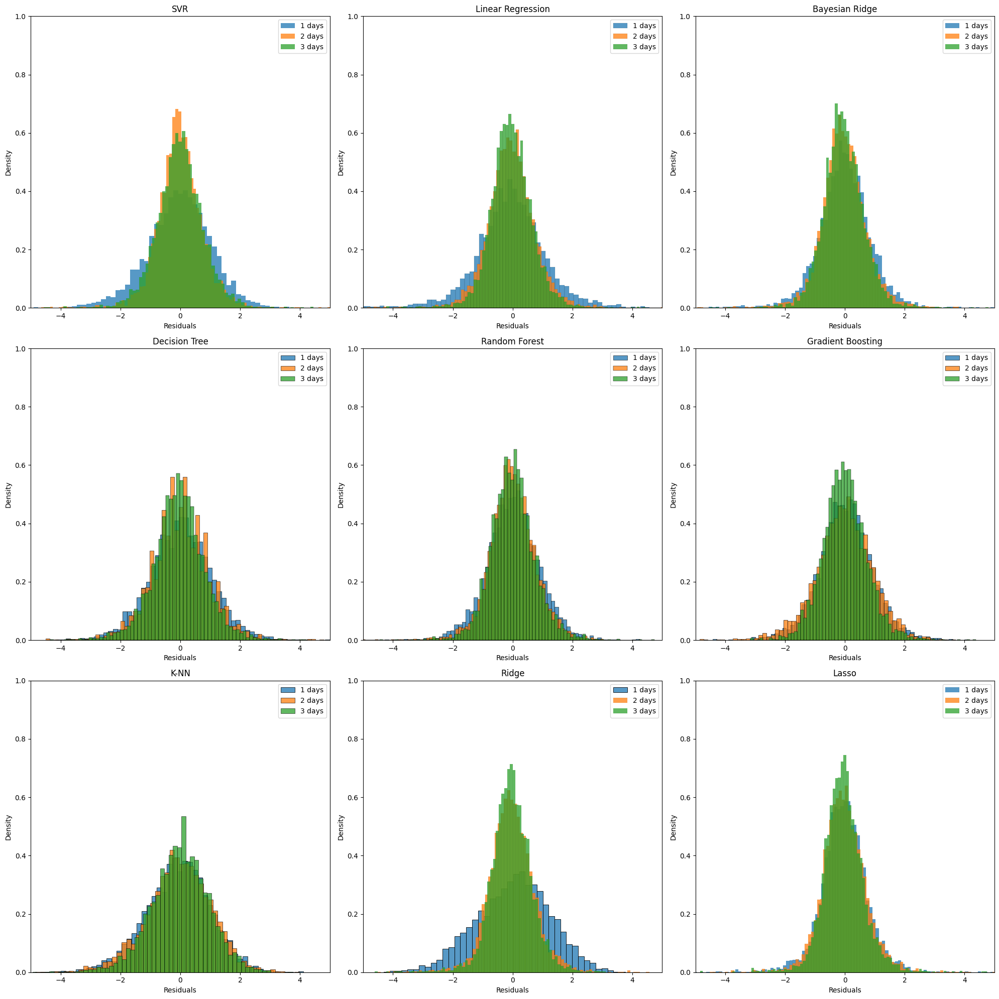

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns
import random as rd

fig, axs = plt.subplots(3, 3, figsize=(20, 20))
axs = axs.flatten()

for i, name in enumerate(results_dict):
    for numDays in models_dict[name]['n_days']:
        pred = results_dict[name][numDays]['pred']
        test = results_dict[name][numDays]['test']
        residuals = rd.sample([val_pred - val_test for val_pred, val_test in zip(pred, test)], 5000)
        sns.histplot(residuals, ax=axs[i], label=f"{numDays} days", stat='density')

    axs[i].set_title(f"{name}")
    axs[i].set_xlabel('Residuals')
    axs[i].set_ylabel('Density')
    axs[i].set_xlim(-5, 5)
    axs[i].set_ylim(0, 1)
    axs[i].legend()

plt.tight_layout()
plt.show()

In [ ]:
from scipy.stats import norm, shapiro

df_gaussian_test = pd.DataFrame(columns=['Model', 'Mean', 'Std', 'p_value'])

for i, name in enumerate(results_dict):
    for numDays in models_dict[name]['n_days']:
        pred = results_dict[name][numDays]['pred']
        test = results_dict[name][numDays]['test']
        residuals = [val_pred - val_test for val_pred, val_test in zip(pred, test)]
        mean, std = norm.fit(residuals)
        _, p_value = shapiro(residuals)
        new_row = {
            'Model': f"{name} ({numDays} days)",
            'Mean': round(mean, 2),
            'Std': round(std, 2),
            'p_value': round(p_value, 2)
        }
        df_gaussian_test = pd.concat([df_gaussian_test, pd.DataFrame(new_row, index=[0])], ignore_index=True)

In [ ]:
df_gaussian_test.sort_values('Std', inplace=True)
print(df_gaussian_test.to_string(index=False))

                     Model  Mean    Std  p_value
Gradient Boosting (3 days) -0.02   0.74      0.0
    Random Forest (3 days) -0.01   0.74      0.0
    Random Forest (2 days) -0.01   0.76      0.0
    Decision Tree (3 days) -0.03   0.87      0.0
    Random Forest (1 days)  0.00   0.89      0.0
Gradient Boosting (1 days) -0.00   0.91      0.0
Gradient Boosting (2 days) -0.01   0.95      0.0
    Decision Tree (2 days) -0.02   0.95      0.0
             K-NN (3 days) -0.02   0.96      0.0
    Decision Tree (1 days) -0.00   1.06      0.0
             K-NN (2 days) -0.06   1.08      0.0
             K-NN (1 days) -0.09   1.11      0.0
   Bayesian Ridge (3 days) -0.05   1.18      0.0
            Ridge (3 days) -0.05   1.19      0.0
            Ridge (1 days) -0.00   1.25      0.0
            Lasso (3 days) -0.04   1.28      0.0
Linear Regression (3 days) -0.04   1.53      0.0
   Bayesian Ridge (2 days) -0.05   1.72      0.0
            Lasso (2 days) -0.05   1.80      0.0
            Ridge (2

In [ ]:
best_model = 'Random Forest'
best_nb_days = 365

y_test = results_dict[best_model][best_nb_days]['test']
y_pred = results_dict[best_model][best_nb_days]['pred']

KeyError: 7

In [ ]:
from plotly import graph_objs as go
plot = go.Figure()


plot.add_trace(go.Scatter(x= dfWind['Date'], y=y_test, mode='lines', name='True'))
plot.add_trace(go.Scatter(x= dfWind['Date'], y=y_pred, mode='lines', name='Predicted'))
plot.update_layout(title=f'{best_model} ({best_nb_days} days)', xaxis_title='Date', yaxis_title='Wind speed (m/s)')
plot.show()